# Problem Set 3

Demetrios Kechris, collaboration with Roger Finnerty

---

This assignment will introduce you to:
1. Shared Computing Cluster.
2. Train a CNN model.
3. Save/restore and fine-tune with model weights.
4. Tensorboard toolkit (optional).
5. Neural style transfer learning.

This code has been tested on Colab.


---

## Preamble

To run and solve this assignment, you need an interface to edit and run ipython notebooks (`.ipynb` files). The easiest way to complete this assignment is to use Google Colab. You can just copy the assignment notebook to your google drive and open it, edit it and run it on Google Colab. All libraries you need are pre-installed on Colab.

---

### Local installation
The alternative is to have a local installation, although we do not recommend it. If you are working on Google Colab, feel free to skip to the next section "More instructions". We recommend using virtual environments for all your installations. Following is one way to set up a working environment on your local machine for this assignment, using [Anaconda](https://www.anaconda.com/distribution/):

- Download and install Anaconda following the instructions [here](https://docs.anaconda.com/anaconda/install/)
- Create a conda environment using `conda create --name dl_env python=3` (You can change the name of the environment instead of calling it `dl_env`)
- Now activate the environment using : `conda activate dl_env`
- Install jupyter lab, which is the [jupyter project's](https://jupyter.org/index.html) latest notebook interface : `pip install jupyterlab`. You can also use the classic jupyter notebooks and there isn't any difference except the interface.
- Install other necessary libraries. For this assignment you need `numpy`, `scipy` , [`pytorch`](https://pytorch.org/get-started/locally/) and `matplotlib`, all of which can be installed using : `pip install <lib_name>`. Doing this in the environment, would install these libraries for `dl_env`. You can also use `conda install`.
- Now download the assignment notebook in a local directory and launching `jupyter lab` in the same directory should open a jupyter lab session in your default browser, where you can open and edit the ipython notebook.
- For deactivating the environment when you are done with it, use : `conda deactivate`.

For users running a Jupyter server on a remote machine :
- Launch Jupyter lab on the remote server (in the directory with the homework ipynb file) using : `jupyter lab --no-browser --ip=0.0.0.0`
- To access the jupyter lab interface on your local browser, you need to set up ssh port forwarding. This can be done by running : `ssh -N -f -L localhost:8888:localhost:8888 <remoteuser>@<remotehost>`. You can now open `localhost:8888` on your local browser to access jupyter lab. This assumes you are running jupyter lab on its default port 8888 on the server.
- Check "Making life easy" section at the end of [this post](https://ljvmiranda921.github.io/notebook/2018/01/31/running-a-jupyter-notebook/) to find how to add functions to your bash run config to do this more easily each time. The post mentions functions for jupyter notebook, but just replace those with jupyter lab if you are using that interface.

The above instructions specify one way of working on the assignment. You can use other virtual environments/ipython notebook interfaces etc. (**not recommended**).

---

### More instructions

If you are new to Python or its scientific library, Numpy, there are some nice tutorials [here](https://www.learnpython.org/) and [here](http://www.scipy-lectures.org/).

In an ipython notebook, to run code in a cell or to render [Markdown](https://en.wikipedia.org/wiki/Markdown)+[LaTeX](https://en.wikipedia.org/wiki/LaTeX) press `Ctrl+Enter` or `[>|]`(like "play") button above. To edit any code or text cell (double) click on its content. To change cell type, choose "Markdown" or "Code" in the drop-down menu above.

To enter your solutions for the written questions, put down your derivations into the corresponding cells below using LaTeX. Show all steps when proving statements. If you are not familiar with LaTeX, you should look at some tutorials and at the examples listed below between \$..\$. We will not accept handwritten solutions.

Put your solutions into boxes marked with **`[double click here to add a solution]`** and press Ctrl+Enter to render text. (Double) click on a cell to edit or to see its source code. You can add cells via **`+`** sign at the top left corner.

**Submission instructions:** please upload your completed **solution .ipynb file and printed PDF file** to [Gradescope](https://www.gradescope.com/courses/718724) (Entry code: NPVN7W) by **March 5, 11:59PM EST** (see Syllabus for due dates and late policy).  

Note: `Vector` stands for `column vector` below.

---

# Problem 1: Setting Up Shared Computing Cluster (10 points)

In this part, we will be trying to use the [Shared Computing Cluster (SCC)](https://www.bu.edu/tech/support/research/computing-resources/scc/). The SCC is a heterogeneous Linux cluster composed of both fully shared and buy-in compute nodes and storage options. You have free access to this resource for EC523.

 Many larger projects that take more storage, compute power, and time to run, are typically executed through here due to the available resources it can provide. The SCC also allows you to schedule batch jobs so you may schedule several models to train at once. Understanding how it works now may benefit you in your final project and your future computing endeavors.


 You may find this SCC resources helpful:

 [SCC tutorial](http://rcs.bu.edu/classes/CS542/SC542.html)

[SCC Cheat Sheet](https://scv.bu.edu/documents/SCC_CheatSheet.pdf)

[SCC Best Practices](https://docs.google.com/document/d/1mDQbyK3HgJwRA-TCgxrgCN3emi-fybSd/edit?usp=sharing&ouid=104691742384921839275&rtpof=true&sd=true)

 (*Hint: If you run out of GPU on Google Colab, you may consider using SCC*)

### 1.1. Connect to Login Node

Using your local machine's terminal, SSH into either scc1 or scc2. You may also use the terminal in VSCode and try remote development there because IDE's are always nice to use: [VSCode Developing on Remote Machine Using SSH](https://code.visualstudio.com/docs/remote/ssh). Once you are connnected to the SCC on your local machine, add a screenshot here:

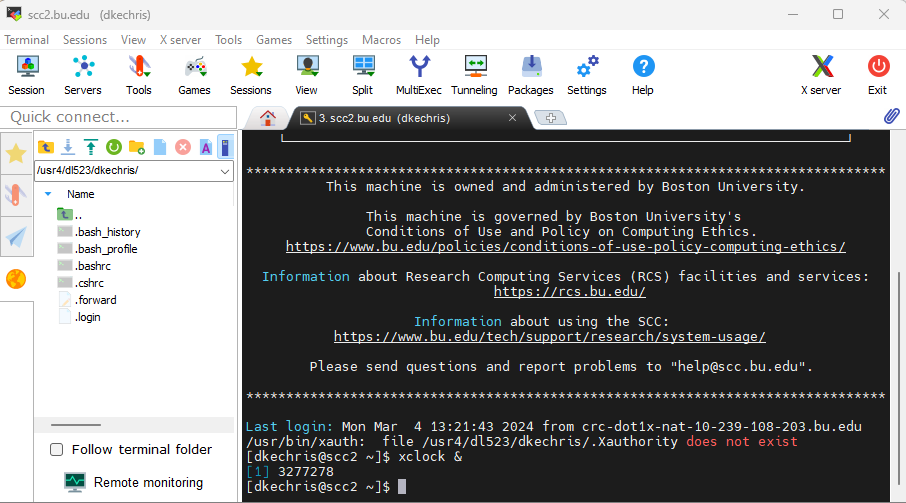

### 1.2 Quotas

Each SCC account has 10 GB home directory and is backed up every night. Additional quotas for the home directory are not available. However, the EC523 directory has a greater quota, so it is recommended to utilize your student directory in the EC523 directory when working with the SCC. The directory is named: /projectnb/dl523/students/dkechris (your username) Check your home directory and dl523 quotas in the terminal and add screenshots:

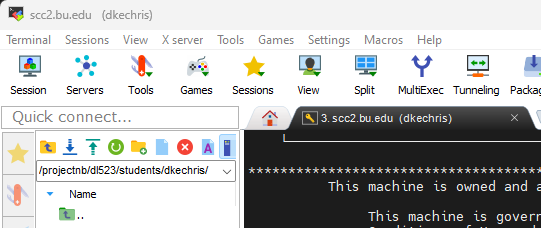

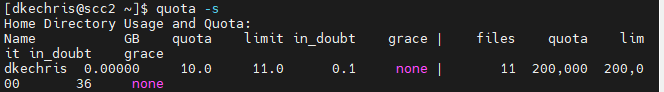

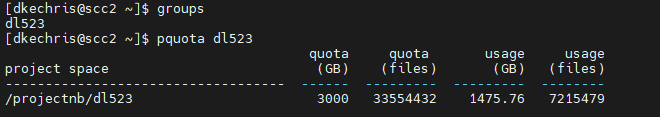

### 1.3 SCC's GPU's

In the node, print out the available [GPUs](https://www.bu.edu/tech/support/research/software-and-programming/programming/multiprocessor/gpu-computing/) available to you on the SCC and add a screenshot. Choose and rank 3 of the GPUs and explain your ranking.

Mmaximizing "GPU Memory Bandwidth" should allow me to minimize my training time. For that reason I'm prioritizing

1) A100-80G

2) A100

3) RTX6000


|GPU | Memory Bandwidth (GB/s) |
|--|-------------------------------|
| A100 | 1,935  |
| A100-80G  |  2,039 |
|  A40 | 696 |
|  A6000 | 768 |
| K40m      | 288  |
| L40       | 864  |
| P100      | 720 |
| P100-16G  | 732  |
| RTX6000   | 960  |
| RTX8000   | 672 |
| TitanV    | 653 |
| TitanXp   | 547  |
| V100      | 900 |
| V100-32G  | 897 |


### 1.4 Running a Batch Job

Run a batch job to execute the following Python script and store it in a text file: [test_script.py](https://drive.google.com/file/d/1io7uz60XmK8JuSuYfxLHhNaRNdwNdHgC/view?usp=sharing)

Add screenshots of your submitted bash file and the output of the code from the SCC:

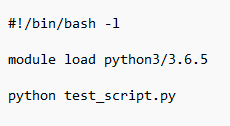

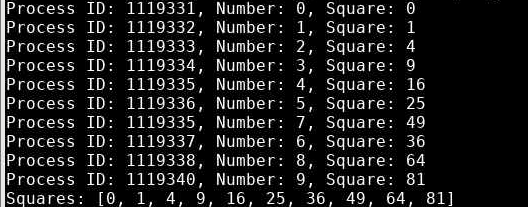

###1.5 Interactive Apps
Launch a Desktop session from the SCC web browser with these specifications:
- Number of hours: 1
- Number of cores: 2
- Number of GPUs: 1
- GPU compute compatibility: 6.0 (P100 or V100)
- Project: dl523

Once your desktop session has launched, open up the terminal in the Desktop session and print out the GPU the session is using and add a screenshot:

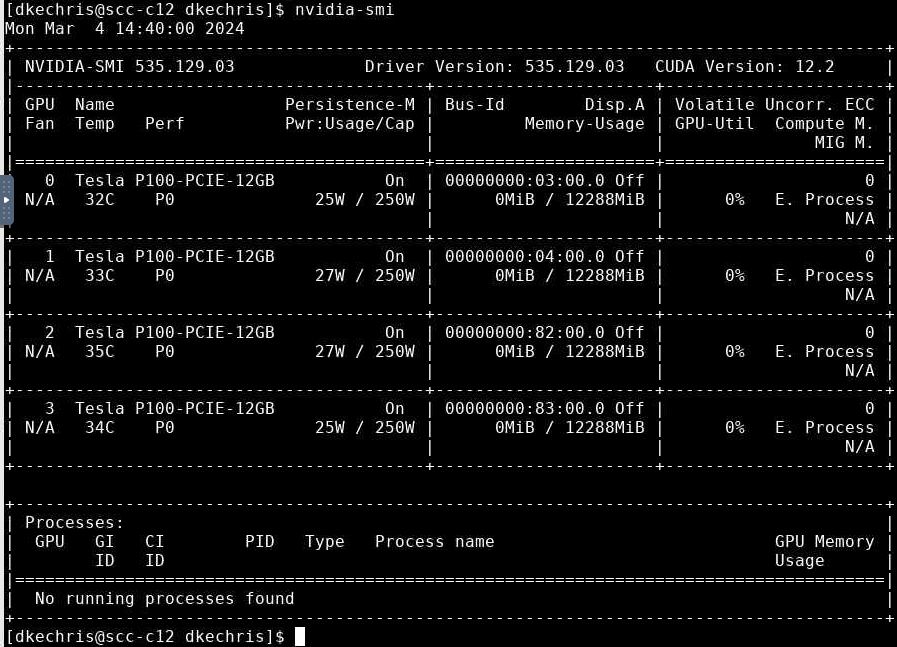

---


# Problem 2: Convolutional Networks (50 points)

In this part, we will experiment with CNNs in PyTorch. You will need to read the documentation of the functions provided below to understand how they work.

**GPU Training.** Smaller networks will train fine on a CPU, but you may want to use GPU training for this part of the homework. You can run your experiments on Colab's GPUs or on BU's  [Shared Computing Cluster (SCC)](http://www.bu.edu/tech/services/research/computation/scc/). You may find this SCC tutorial helpful: [SCC tutorial](http://rcs.bu.edu/classes/CS542/SC542.html). To get access to a GPU on Colab, go to `Edit->Notebook Settings` in the notebook and set the hardware accelerator to "GPU".

In [40]:
# check GPU status
!nvidia-smi

# I ran out of GPU and accidentally ran this again, but I got a nice print out
# when I ran it showing the T4 GPU available to use

/bin/bash: line 1: nvidia-smi: command not found


### 2.1 Training a CNN on Pokemons


The Pokemon (Generation One) [Dataset](https://www.kaggle.com/datasets/thedagger/pokemon-generation-one) is a synthetic image dataset of Pokemons separated based on folders with the name of the Pokemon. Below are example images of the Pokemons we'll be attempting to classify.

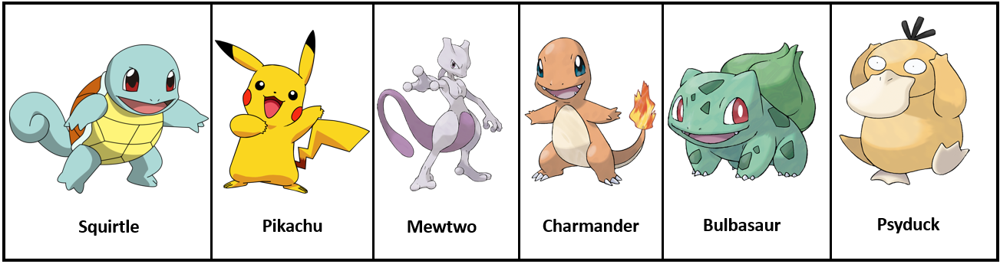

In this homework, we will create and train a convolutional network (CNN) on the dataset to classify the Pokemons.

In [41]:
import torch
import torchvision
from torchvision import datasets
import torchvision.transforms as transforms

### 2.1.0 Data Download
The data is in the shared google drive https://drive.google.com/drive/folders/18Glql2V3dl0MOGpu6MnHc92E1a5Wn7gS?usp=sharing. This dataset is around 365 MB. To avoid spending time download and upload it to Colab, you can click the link above and then right click on the `EC523 HW3-2024` folder, select **Add a shortcut to Drive** to save a SHORTCUT in your Google Drive. Then you should be able to see a `EC523 HW3-2024` folder in your google drive.

You should be able to find the data at `/content/drive/MyDrive/EC523 HW3-2024/Pokemon` after running this cell


In [42]:
from google.colab import drive
drive.mount('/content/drive', force_remount = True)
import matplotlib.pyplot as plt
import numpy as np
import os

Mounted at /content/drive


Check if the path is correct.

In [43]:
# run this cell to check if the output is the same as the next cell

!ls /content/drive/MyDrive/EC523\ HW3-2024/Pokemon

Pokemon_test  Pokemon_train


In [44]:
# no need to run this cell (but use the output of this cell to make sure that you are getting the same output in previous cell)

!ls /content/drive/MyDrive/EC523\ HW3-2024/Pokemon

Pokemon_test  Pokemon_train


In [45]:
PATH_OF_DATA = '/content/drive/MyDrive/EC523 HW3-2024/Pokemon/'
MY_PATH = '/content/drive/MyDrive/EC523'

 Take a look at the [Training a Classifier](https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html#sphx-glr-beginner-blitz-cifar10-tutorial-py) tutorial for an example. Follow the settings used there, such as batch size of 4 for the `torch.utils.data.DataLoader`, etc. Note that in this part we don't use data normalization.

In [46]:
# Comment 0: define transformation that you wish to apply on image
data_transforms_no_norm = transforms.Compose([transforms.ToTensor(),
     transforms.Resize((64, 64))])
# Comment 1 : Load the datasets with ImageFolder
trainset_no_norm = datasets.ImageFolder(root = PATH_OF_DATA + "Pokemon_train",
                                      transform = data_transforms_no_norm)
# Comment 2: Using the image datasets and the transforms, define the dataloaders
train_sampler_no_norm = torch.utils.data.RandomSampler(trainset_no_norm)
trainloader_no_norm = torch.utils.data.DataLoader(trainset_no_norm, batch_size = 4, sampler = train_sampler_no_norm, shuffle = False, num_workers = 2)

testset_no_norm = datasets.ImageFolder(root=PATH_OF_DATA + "/Pokemon_test",
                               transform = data_transforms_no_norm)
testloader_no_norm = torch.utils.data.DataLoader(testset_no_norm, batch_size = 4, shuffle = False, num_workers = 2)

['Pokemon_test', 'Pokemon_train']
/content/drive/MyDrive/EC523 HW3-2024/Pokemon/Pokemon_train
The labels are:  ('Bulbasaur', 'Charmander', 'Mewtwo', 'Pikachu', 'Psyduck', 'Squirtle')


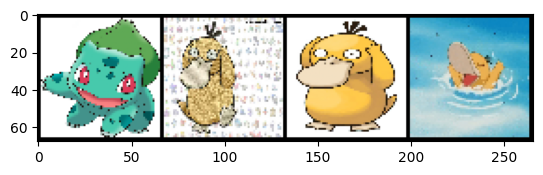

Bulbasaur Psyduck Psyduck Psyduck


In [47]:
# show some examples
import matplotlib.pyplot as plt
import numpy as np
import os

dir_path = '/content/drive/MyDrive/EC523 HW3-2024/Pokemon/'
classes = os.listdir(dir_path)
print(classes)

# Get a list of all items (files and directories) in the directory
items = os.listdir(PATH_OF_DATA + "Pokemon_train")
print(PATH_OF_DATA + "Pokemon_train")

classes_labels = ['Bulbasaur', 'Charmander', 'Mewtwo', 'Pikachu', 'Psyduck', 'Squirtle']

# Convert the list of labels to a tuple
labels_tuple = tuple(classes_labels)

print('The labels are: ', labels_tuple)

# functions to show an image
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
dataiter = iter(trainloader_no_norm)
images, labels = next(dataiter)

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join(f'{classes_labels[labels[j]]:5s}' for j in range(4)))

### 2.1.1 CNN Model
Next, we will train a CNN on the data. We have defined a simple CNN for you with two convolutional layers and two fully-connected layers below.

In [48]:
import torch.nn as nn
import torch.nn.functional as F

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 16, kernel_size = 3, padding = 1)

        self.conv2 = nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = 3, padding = 1)

        self.pool = nn.MaxPool2d(kernel_size = 2, stride = 2)

        self.relu = nn.ReLU()

        self.fc1 = nn.Linear(32 * 16 * 16, 128)                                 # Adjust the input size based on the pooling

        self.fc2 = nn.Linear(128, 64)

        self.fc3 = nn.Linear(64, 6)


    def forward(self, x):

        x = self.conv1(x)

        x = self.relu(x)

        x = self.pool(x)

        x = self.conv2(x)

        x = self.relu(x)

        x = self.pool(x)

        x = x.view(-1, 32 * 16 * 16)

        x = self.fc1(x)

        x = self.fc2(x)

        x = self.fc3(x)

        return x

net = Net()

Instantiate the cross-entropy loss `criterion`, and an SGD optimizer from the `torch.optim` package with learning rate $.005$ and momentum $.9$. You may also want to enable GPU training using `torch.device()`.

In [49]:
## -- ! code required
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.005, momentum=0.9)
net.to(device)

Net(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (relu): ReLU()
  (fc1): Linear(in_features=8192, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=6, bias=True)
)

### 2.1.2 Training
Write the training loop that makes three full passes through the dataset (10 epochs) using SGD. Your batch size should be 4.

Using a T4 GPU on colab, it will take around 25 min to train. So go slack off for a while...

![reddit xkcd comic](https://i.redd.it/5cjdqxcg07k11.png)

In [50]:
def train_on_Pokemon(net, optimizer, device, trainloader):
  if torch.cuda.is_available():
      net.cuda()
  net.train()

  for epoch in range(10):                                                       # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader):
        ## -- ! code required
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device) # Send to gpu

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        # print statistics
        #if i % 2000 == 1999:    # print every 2000 mini-batches
        #    print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 2000:.3f}')
        #    running_loss = 0.0

  print('Finished Training')
  return net



In [51]:
# kick off the training
net = train_on_Pokemon(net, optimizer, device, trainloader_no_norm)

Finished Training


### 2.1.3 Test Accuracy
Load the test data (don't forget to move it to GPU if using). Make predictions on it using the trained network and compute the accuracy. You should see an accuracy of above 60%.

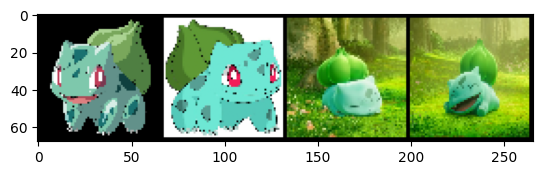

GroundTruth:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur
Predicted:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur
Accuracy of the network on the test images: 80 %
Accuracy of the network on the test images: 80 %


In [52]:
def test_on_Pokemon(net, testloader):

  ## -- ! code required
  dataiter = iter(testloader)
  images, labels = next(dataiter)

  # print images
  imshow(torchvision.utils.make_grid(images))
  print('GroundTruth: ', ' '.join(f'{classes_labels[labels[j]]:5s}' for j in range(4)))

  images, labels = images.to(device), labels.to(device) # Send to gpu

  outputs = net(images)
  _, predicted = torch.max(outputs, 1)
  print('Predicted: ', ' '.join(f'{classes_labels[predicted[j]]:5s}'
                              for j in range(4)))

  correct = 0
  total = 0
  # since we're not training, we don't need to calculate the gradients for our outputs
  with torch.no_grad():
    for data in testloader:
      images, labels = data
      images, labels = images.to(device), labels.to(device) # Send to gpu
      # calculate outputs by running images through the network
      outputs = net(images)
      # the class with the highest energy is what we choose as prediction
      _, predicted = torch.max(outputs.data, 1)
      total += labels.size(0)
      correct += (predicted == labels).sum().item()
  print(f'Accuracy of the network on the test images: {100 * correct // total} %')
  return 100 * correct // total

acc = test_on_Pokemon(net, testloader_no_norm)

print(f'Accuracy of the network on the test images: {acc} %')

### 2.2 Understanding the CNN Architecture

Explain the definition of the following terms. What is the corresponding setting in our net? Are there any other choices?

  - Stride
  - Padding
  - Non-linearity
  - Pooling
  - Loss function
  - Optimizer
  - Learning rate
  - Momentum


  **Solution:**

- Stride - how many pixels between each calculation, a stride of 2 (like our network) is calculating for every other pixel.
  
- Padding - adding extra rows/columns to augment data size. Our network has a padding of 1 to maintain the same dimensions

- Non-linearity - whether a layer is linear or non-linear. A network made of only linear layers will only be able to learn about linearly seperatable data, much like the perceptron. The ReLU functions we are using are key to allowing the neural net to learn multi-fasceted problems.

- Pooling - how many pixels to take a look over. A max pool for a 3x3 returns the highest pixel within that 3x3 area. Pooling can be any shape and our pooling is over a 2x2 area

- Loss function - how the loss is calculated. Loss can be anything from MSE to cross entropy (which we're using). Cross entropy works best for classification problems like this one

- Optimizer - the type of function used to calculate the update step. The SGD optimizer which we are using is well suited for image classification, but there are options which are well suited for other uses, such as ADAM and Adagrad.

- Learning rate - the learning rate modifies the update step of the optimizer. A higher learning rate will take more of the gradient in the update step. A low learning rate will be more accurate but take longer to run, whereas a high learning rate will calculate faster but can lead to instability and sometimes prevent the network from converging. Typicaly a smaller batch size needs a smaller learning rate to prevent outliers from disproportionately affecting the model. Our lr of .005 is a good compromise for the batch size we have.

- Momentum - how much of the previous gradients is taken into consideration, which helps the gradient to be more resilient to outliers and mantain a good descent. A higher momentum will cause the last non-negligible gradient to be further back in time. A momentum of 0 will only look at the current gradient to update, where our momentum of .9 will take into consideration the last 10 gradients (each older one having less impact)

### 2.3 Understanding the effect of normalization
In this section, we explore the effect of data normalization on model training. Specificly, we add the normalization in data transform and re-train the model. Run the following cells. Then write analysis that compare the results with and without data augmentation.

#### 2.3.1 Re-train the model with data augmentation

In [53]:
# Comment 0: define transformation that you wish to apply on image
data_transforms = transforms.Compose([transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     transforms.Resize((64, 64))])
# Comment 1 : Load the datasets with ImageFolder
trainset = datasets.ImageFolder(root = PATH_OF_DATA + "/Pokemon_train",
                                      transform = data_transforms)
# Comment 2: Using the image datasets and the transforms, define the dataloaders
train_sampler = torch.utils.data.RandomSampler(trainset)
trainloader = torch.utils.data.DataLoader(trainset, batch_size = 4, sampler = train_sampler, shuffle = False, num_workers = 2)

testset = datasets.ImageFolder(root = PATH_OF_DATA + "/Pokemon_test",
                               transform = data_transforms)
testloader = torch.utils.data.DataLoader(testset, batch_size = 4, shuffle = False, num_workers = 2)

In [54]:
## -- ! code required
  # train the model with data normalization
net = Net()
net = train_on_Pokemon(net, optimizer, device, trainloader)

#acc = test_on_Pokemon(net, testloader)
#
#print(f'Accuracy of the network on the the test images: {acc} %')

Finished Training


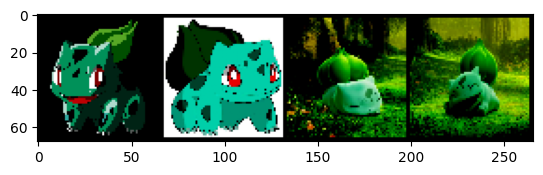

GroundTruth:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur
Predicted:  Squirtle Psyduck Psyduck Psyduck
Accuracy of the network on the test images: 15 %
Accuracy of the network on the the test images: 15 %


In [55]:
acc = test_on_Pokemon(net, testloader)

print(f'Accuracy of the network on the the test images: {acc} %')

** *italicized text*Comparison:**

In theory, normalizing the data should improve the performance and stability of the model, increasing the accuracy of the network, as normalized data is easier to train on, however I am not currently seeing that.

I've run this multiple times, and only once have I seen an accuracy above 20.

#### 2.3.2 Explore the effect of normalization layer in model
In this section, we explore the effect of adding normalization layer into the model. In the code block below, insert a batch normalization layer after each convolutional layer.

In [17]:
import torch.nn as nn
import torch.nn.functional as F

class Net_with_BatchNorm(nn.Module):
    def __init__(self):
        super(Net_with_BatchNorm, self).__init__()
        ## -- ! code required -- -- define batch normalization layer for each convolutional layer
        # batch only out of prev
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 16, kernel_size = 3, padding = 1)

        #add batchnorm
        self.batch1 = nn.BatchNorm2d(16)

        self.conv2 = nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = 3, padding = 1)

        #add batchnorm
        self.batch2 = nn.BatchNorm2d(32)

        self.pool = nn.MaxPool2d(kernel_size = 2, stride = 2)

        self.relu = nn.ReLU()

        self.fc1 = nn.Linear(32 * 16 * 16, 128)                                 # Adjust the input size based on the pooling

        self.fc2 = nn.Linear(128, 64)

        self.fc3 = nn.Linear(64, 6)


    def forward(self, x):
        ## -- ! code required -- -- define batch normalization layer after each convolutional layer
        x = self.conv1(x)

        #add batchnorm
        x = self.batch1(x)

        x = self.relu(x)

        x = self.pool(x)

        x = self.conv2(x)

        #add batchnorm
        x = self.batch2(x)

        x = self.relu(x)

        x = self.pool(x)

        x = x.view(-1, 32 * 16 * 16)

        x = self.fc1(x)

        x = self.fc2(x)

        x = self.fc3(x)

        return x

net_bn = Net_with_BatchNorm() ## -- ! code required
optimizer =  optim.SGD(net_bn.parameters(), lr=0.005, momentum=0.9) ## -- ! code required
net_bn.to(device)

Net_with_BatchNorm(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batch1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (batch2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (relu): ReLU()
  (fc1): Linear(in_features=8192, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=6, bias=True)
)

Next, we re-train the model with batch normalization layer on the dataset without data augmentation used. Write about your findings.

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Finished Training


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

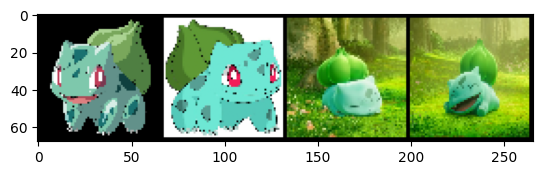

GroundTruth:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur
Predicted:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Accuracy of the network on the test images: 83 %
Accuracy of the network on the test images: 83 %


In [19]:
net_bn = train_on_Pokemon(net_bn, optimizer, device, trainloader_no_norm)

acc = test_on_Pokemon(net_bn, testloader_no_norm)

print(f'Accuracy of the network on the test images: {acc} %')

**Findings:**

Batch normalization makes training quicker and increases the accuracy of the network by recentering the data.

#### 2.3.3 Explore different model normalization methods
In this section, we experiment with different model normalization layers. In the code block below, insert a layer normalization layer after each convolutional layer.

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class Net_with_LayerNorm(nn.Module):
    def __init__(self):
        super(Net_with_LayerNorm, self).__init__()
        ## -- ! code required -- -- define layer normalization layer for each convolutional layer
        # layer out * param out of prev
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 16, kernel_size = 3, padding = 1)

        # add LayerNorm (imagesize * channels)
        self.layer1 = nn.LayerNorm([16,64,64])

        self.conv2 = nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = 3, padding = 1)

        # add LayerNorm (imagesize * channels)
        self.layer2 = nn.LayerNorm([32, 32, 32])

        self.pool = nn.MaxPool2d(kernel_size = 2, stride = 2)

        self.relu = nn.ReLU()

        self.fc1 = nn.Linear(32 * 16 * 16, 128)                                 # Adjust the input size based on the pooling

        self.fc2 = nn.Linear(128, 64)

        self.fc3 = nn.Linear(64, 6)


    def forward(self, x):
        ## -- ! code required -- -- define layer normalization layer after each convolutional layer
        x = self.conv1(x)

        #add LayerNorm
        x = self.layer1(x)

        x = self.relu(x)

        x = self.pool(x)

        x = self.conv2(x)

        #add LayerNorm
        x = self.layer2(x)

        x = self.relu(x)

        x = self.pool(x)

        x = x.view(-1, 32 * 16 * 16)

        x = self.fc1(x)

        x = self.fc2(x)

        x = self.fc3(x)

        return x

net_ln = Net_with_LayerNorm() ## -- ! code required
optimizer = optim.SGD(net_ln.parameters(), lr=0.005, momentum=0.9) ## -- ! code required
net_ln.to(device)

Net_with_LayerNorm(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (layer1): LayerNorm((16, 64, 64), eps=1e-05, elementwise_affine=True)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (layer2): LayerNorm((32, 32, 32), eps=1e-05, elementwise_affine=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (relu): ReLU()
  (fc1): Linear(in_features=8192, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=6, bias=True)
)

Next, we re-train the model with layer normalization layer on the dataset without data augmentation used. Write about your findings.

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Finished Training


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

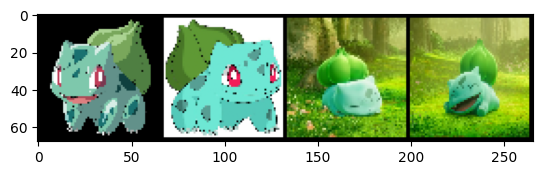

GroundTruth:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur
Predicted:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Accuracy of the network on the test images: 87 %
Accuracy of the network on the test images: 87 %


In [ ]:
net_ln = train_on_Pokemon(net_ln, optimizer, device, trainloader_no_norm)

acc = test_on_Pokemon(net_ln, testloader_no_norm)

print(f'Accuracy of the network on the test images: {acc} %')

**Findings:**

Layer normalization also increases the accuracy of the network (more so than batchnorm). It normalizes the weights by rescaling and shifting the data to within a standard gaussian distribution (mean = 0, var = 1), increasing training speed and accuracy while attempting to prevent vanishing gradients.

### 2.4 Improving accuracy
We will now vary the architecture and training hyper-parameters of the network to try and achieve a higher accuracy on the dataset. Try to improve on the initial accuracy we got and increase it to above 80%. It is more important that you try varying different architecture and training settings to understand how they affect (or not) the results.

### 2.4.1 Architecture
First, try to vary the structure of the network. For example, you can still use  two  convolutional layers, but vary their parameters. You can also try adding more convolutional, pooling and/or fully-connected (FC) layers.

Keep careful track of performance as a function of architecture changes using a table or a plot. For example, you can report the final test accuracy on 3 different numbers of channels (filters), 3 different sizes of kernels, 3 different strides, and 3 different dimensions of the final fully connected layer, using a table like the one below. Each time when you vary one parameter, you should **keep the others fixed at the original value**. Use the code in Q2.3.1 as your baseline.

Explain your results. Note, you're welcome to decide how many training epochs to use, but do report the number you used and keep it the same for all architecture changes (as well as other training hyper-parameters). Be careful not to change more than one thing between training/test runs, otherwise you will not know which of the multiple changes caused the results to change.

**Please implement your experiments in a separate cell, DO NOT change your codes in Q2.3.1 for this question. During submission, you are Not required to submit any code for this question.**

**Experimental Results:**

|# of Filter|Accuracy|
|--|-------------------------------|
|base = 16 | 72 %  |
|20 filters | 74 %  |
| 26 filters  |  82 %|
|  32 filters | 85 %|

|Conv1 Kernel size|Accuracy|
|--|-------------------------------|
|base = 3 | 76 %  |
| kernel size = 2 | 75 % |
| kernel size = 4 | 74 % |
| kernel size = 5 | 80 % |

|Pooling Stride|Accuracy|
|--|-------------------------------|
| base = 2 | 72 %  |
| Stride = 3 | 91 % |
| Stride = 4 | 84 % |
| Stride = 5 | 85 % |

|FC1 size|Accuracy|
|--|-------------------------------|
| base = 128 | 84 % |
| FC size = 64 | 78 % |
| FC size = 256 | 84 % |
| FC size = 512 | 78 % |

- # of filters - Accuracy increases as more filters are added. This makes sense since the network has more connections available to better classifiy the data.

- Kernel Size - Accuracy increases as kernel size increases. This is not necessarily true for all convolution layers, as a higher kernel size may look at too much data. In this case, accuracy went down for 2,4 and up for 5. There must be something about that 5x5 that allows it to more accurately classify the images.

-Pooling Size - Like kernel size, changing pooling size will note necessarily result in increased performance. Increasing the stride from base 2 to 3 increases the accuracy by 19 percentage points, possibly by reducing the number of parameters to train. Strides of 4 and 5 both had lower accuracy than stride of 3, but higher accuracy than stride of 2.

- FC layer size - In theory, accuracy should increase for larger FC layer sizes, as there are more paths with which to better classify the data. In practice it does not always happen that way, in part because it can be difficult to train extra parameters in the same number of epochs. both 128 and 256 had the highest accuracy of 84, with 64 and 512 having lower accuracies. 64 may not have enough weights to as accurately classify the data, and 512 may have too many weights to fully train with the 10 epochs we have.

### 2.4.2 Training Hyper-Parameters

Repeat the process for training hyper-parameters, exploring at least three of the following:
- training iterations, optionally with early stopping
- learning rate
- momentum
- optimizer
- initialization
- dropout
- batch normalization
- dataset augmentation

Document your results with tables or figures, and explain what happened. You may want to use Tensorboard (see Problem 2 below) but this is optional.

What is the best accuracy you were able to achieve on the test set, and which factors contributed the most to the improvement?

**Please implement your experiments in a separate cell, DO NOT change your codes in Q2.3.1 for this question. During submission, you are Not required to submit any code for this question.**

**Experimental Results:**


|Learning rate|Accuracy|
|--|-------------------------------|
| base = .005 | 84 %  |
|.001 | 88 %  |
| .01  |  28 %|
|  .025 | 16 %|

| Momentum |Accuracy|
|--|-------------------------------|
| base = 2 | 84 %  |
| kernel size = 2 | 90 % |
| kernel size = 4 | 90 % |
| kernel size = 5 | 16 % |

|Optimizer type (LR = .005) |Accuracy|
|--|-------------------------------|
| base = SGD | 84 %  |
| ADAM| 16 % |
| ASGD |  83 % |
| Adadelta | 70 % |


- Learning rate - the learning rate modifies the update step of the optimizer. A higher learning rate will take more of the gradient in the update step. The low learning rate of .001 is more accurate, whereas the higher learning rates of .01 and .025 were too large to converge and create an effective classifer. Our lr of .005 is a good compromise for the batch size we have.

- Momentum - how much of the previous gradients is taken into consideration, which helps the gradient to be more resilient to outliers and mantain a good descent.  A momentum of 0 will only look at the current gradient to update, where our momentum of .9 will take into consideration the last 10 gradients. The slightly lower momentums of .7 and .8 both yielded higher accuracy classifiers. Perhaps the learning rate is high enough that the oldest 2 gradients are no longer relevant.

- Optimizer - the type of function used to calculate the update step. The SGD optimizer which we are using is well suited for image classification. ASGD (Averaged Stochastic Gradient Descent) takes the average of the batch for it's gradient, and performs slightly worse than our base model. ADAM is a poor fit for this classification problem, but it's possible that the .005 learning rate is too high for it. I chose to use the same learning rate for all optimizers to have a "level field" but perhaps a learning rate of .001 would have performed better. Adadelta uses an adaptive learning rate for SGD that allows it to keep learning where other models may stop. With only 10 epochs, it's difficult to say if the learning rate is too low or the number of epochs to few for adadelta to classify better than SGD. Regardless, SGD is a very good choice for this image classification problem.



---


# Bonus: Adversarial Attacks (15 points)

As we have seen, gradient descent is a common and useful way of training that result int the minimization of loss. It is possible to run gradient ascent on a model by taking the gradient with respect to x rather than the weights. We can consider this ascent as an adversarial attack on our model when used in tandem with standard gradient descent because it disrupts how our original model learns. In the following question, we will implement gradient ascent on our model from question 1 and analyze the benefits of training under an adversarial attack.


##Bonus 1: Attack your network (5 points)

For this question you will be writing a singular attack on your network which you just trained for question 2. You will need to create fake images by taking the gradient of the inputs as mentioned above and updating your x values. You will then train the model once on these fake images. Compare your accuracy before and after the attack.

**Hint:** When updating the images, use the formula $x' = x + \epsilon * \text{sign}(\nabla_x J(\theta,x,y))$ Where epsilon is a tunable parameter to limit the size of the gradient.

/content/drive/MyDrive/EC523/trained_model_batch1.pt


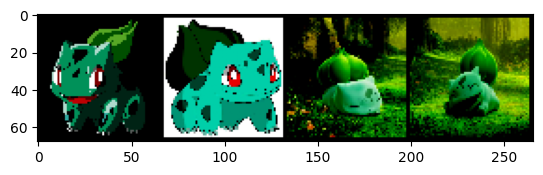

GroundTruth:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur
Predicted:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur
Accuracy of the network on the test images: 90 %
Accuracy of the momentum=0.8 network on the the test images: 90 %


In [21]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

# Comment 0: define transformation that you wish to apply on image
data_transforms = transforms.Compose([transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
     transforms.Resize((64, 64))])
# Comment 1 : Load the datasets with ImageFolder
trainset = datasets.ImageFolder(root = PATH_OF_DATA + "/Pokemon_train",
                                      transform = data_transforms)
# Comment 2: Using the image datasets and the transforms, define the dataloaders
train_sampler = torch.utils.data.RandomSampler(trainset)
trainloader = torch.utils.data.DataLoader(trainset, batch_size = 4, sampler = train_sampler, shuffle = False)

testset = datasets.ImageFolder(root = PATH_OF_DATA + "/Pokemon_test",
                               transform = data_transforms)
testloader = torch.utils.data.DataLoader(testset, batch_size = 4, shuffle = False)

epsilons = [0, .05, .1, .15, .2, .25, .3]


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()

net = Net()
optimizer = optim.SGD(net.parameters(), lr=0.005, momentum=0.8)
net.to(device)
#net = train_on_Pokemon(net, optimizer, device, trainloader)

print(MY_PATH + '/trained_model_batch1.pt')
#torch.save(net.state_dict(), MY_PATH + '/trained_model_batch1.pt')
#torch.save(net.state_dict(), 'trained_model_batch1.pt')
#files.download('checkpoint.pth')

## -- ! code required
net.load_state_dict(torch.load(MY_PATH + '/trained_model.pt'))
net.eval()

acc = test_on_Pokemon(net, testloader)
print(f'Accuracy of the momentum=0.8 network on the the test images: {acc} %')


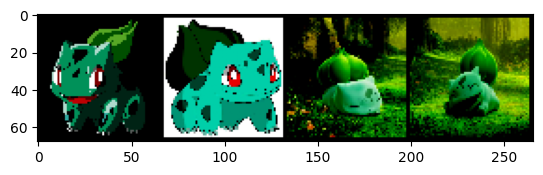

GroundTruth:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur
Predicted:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur
Accuracy of the network on the test images: 90 %
Accuracy of the momentum=0.8 network on the the test images: 90 %


In [22]:
net.load_state_dict(torch.load(MY_PATH + '/trained_model_batch4_90.pt'))
net.eval()

testloader = torch.utils.data.DataLoader(testset, batch_size = 4, shuffle = False)
acc = test_on_Pokemon(net, testloader)
print(f'Accuracy of the momentum=0.8 network on the the test images: {acc} %')

Epsilon: 0	Test Accuracy = 78 / 90 = 0.8666666666666667
Epsilon: 0.05	Test Accuracy = 8 / 90 = 0.08888888888888889
Epsilon: 0.1	Test Accuracy = 1 / 90 = 0.011111111111111112
Epsilon: 0.15	Test Accuracy = 0 / 90 = 0.0
Epsilon: 0.2	Test Accuracy = 0 / 90 = 0.0
Epsilon: 0.25	Test Accuracy = 0 / 90 = 0.0
Epsilon: 0.3	Test Accuracy = 0 / 90 = 0.0
[0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
[0.8666666666666667, 0.08888888888888889, 0.011111111111111112, 0.0, 0.0, 0.0, 0.0]


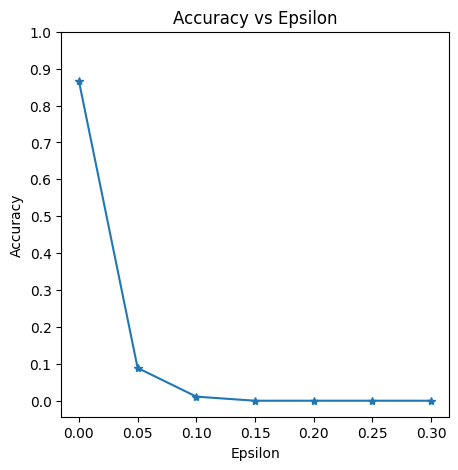

In [23]:
testloader = torch.utils.data.DataLoader(testset, batch_size = 1, shuffle = False)

def fgsm_attack(image, epsilon, data_grad):
    # Collect the element-wise sign of the data gradient
    sign_data_grad = data_grad.sign()

    # Create the perturbed image by adjusting each pixel of the input image
    perturbed_image = image + epsilon*sign_data_grad

    # Adding clipping to maintain [0,1] range
    perturbed_image = torch.clamp(perturbed_image, 0, 1)

    # Return the perturbed image
    return perturbed_image


# restores the tensors to their original scale
def denorm(batch, mean=[0.1307], std=[0.3081]):
    """
    Convert a batch of tensors to their original scale.

    Args:
        batch (torch.Tensor): Batch of normalized tensors.
        mean (torch.Tensor or list): Mean used for normalization.
        std (torch.Tensor or list): Standard deviation used for normalization.

    Returns:
        torch.Tensor: batch of tensors without normalization applied to them.
    """
    if isinstance(mean, list):
        mean = torch.tensor(mean).to(device)
    if isinstance(std, list):
        std = torch.tensor(std).to(device)

    return batch * std.view(1, -1, 1, 1) + mean.view(1, -1, 1, 1)



def test( model, device, test_loader, epsilon ):
    # Accuracy counter
    correct = 0
    adv_examples = []

    # Loop over all examples in test set
    for data, target in test_loader:

        # Send the data and label to the device
        data, target = data.to(device), target.to(device)

        # Set requires_grad attribute of tensor. Important for Attack
        data.requires_grad = True

        # Forward pass the data through the model
        output = model(data)
        init_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability

        #print(output)
        #print(target)
        #print(init_pred)

        # If the initial prediction is wrong, don't bother attacking, just move on
        # if np.array_equal(init_pred.numpy().reshape((1,4)), target.numpy().reshape((1,4))): # trying to fix batch
        if init_pred.item() != target.item():
            continue

        # Calculate the loss
        loss = F.nll_loss(output, target)

        # Zero all existing gradients
        model.zero_grad()

        # Calculate gradients of model in backward pass
        loss.backward()

        # Collect ``datagrad``
        data_grad = data.grad.data

        # Restore the data to its original scale
        data_denorm = denorm(data)

        # Call FGSM Attack
        perturbed_data = fgsm_attack(data_denorm, epsilon, data_grad)

        # Reapply normalization
        perturbed_data_normalized = transforms.Normalize((0.1307,), (0.3081,))(perturbed_data)

        # Re-classify the perturbed image
        output = model(perturbed_data_normalized)

        # Check for success
        final_pred = output.max(1, keepdim=True)[1] # get the index of the max log-probability
        if final_pred.item() == target.item():
            correct += 1
            # Special case for saving 0 epsilon examples
            if epsilon == 0 and len(adv_examples) < 5:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )
        else:
            # Save some adv examples for visualization later
            if len(adv_examples) < 5:
                adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
                adv_examples.append( (init_pred.item(), final_pred.item(), adv_ex) )

    # Calculate final accuracy for this epsilon
    final_acc = correct/float(len(test_loader))
    print(f"Epsilon: {epsilon}\tTest Accuracy = {correct} / {len(test_loader)} = {final_acc}")

    # Return the accuracy and an adversarial example
    return final_acc, adv_examples


accuracies = []
examples = []

# Run test for each epsilon
for eps in epsilons:
    acc, ex = test(net, device, testloader, eps)
    accuracies.append(acc)
    examples.append(ex)

print(epsilons)
print(accuracies)

plt.figure(figsize=(5,5))
plt.plot(epsilons, accuracies, "*-")
plt.yticks(np.arange(0, 1.1, step=0.1))
plt.xticks(np.arange(0, .35, step=0.05))
plt.title("Accuracy vs Epsilon")
plt.xlabel("Epsilon")
plt.ylabel("Accuracy")
plt.show()

Write your analysis on performance here:

**Analysis of Performance:**

The model is clearly not robust enough to handle any adversarial noise. Even an epsilon of .05 is enough to knock the percentage correct under 9%

##Bonus 2: Train Under Attack (5 points)
Train a model from scratch using an adversarial attack as part of the training. Starting with the method you wrote to train in question 2, modify the code to train over fake images. You should not modify your previous code; rather, you should copy it over and make a new method.

In [24]:
import torch.nn as nn
import torch.nn.functional as F

class Net_adv(nn.Module):
    def __init__(self):
        super(Net_adv, self).__init__()

        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 16, kernel_size = 3, padding = 1)

        self.conv2 = nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = 3, padding = 1)

        self.pool = nn.MaxPool2d(kernel_size = 2, stride = 2)

        self.relu = nn.ReLU()

        self.fc1 = nn.Linear(32 * 16 * 16, 128)                                 # Adjust the input size based on the pooling

        self.fc2 = nn.Linear(128, 64)

        self.fc3 = nn.Linear(64, 6)


    def forward(self, x):

        x = self.conv1(x)

        x = self.relu(x)

        x = self.pool(x)

        x = self.conv2(x)

        x = self.relu(x)

        x = self.pool(x)

        x = x.view(-1, 32 * 16 * 16)

        x = self.fc1(x)

        x = self.fc2(x)

        x = self.fc3(x)

        return x

def train_Net_adv(net, optimizer, device, trainloader, epsilon):
  if torch.cuda.is_available():
      net.cuda()
  net.train()

  for epoch in range(10):                                                       # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader):
        ## -- ! code required
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device) # Send to gpu

        #perturb images
        # will crash because of batch size

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = F.nll_loss(outputs, labels)
        # loss = criterion(outputs, labels)
        inputs.requires_grad_(True)
        loss.requires_grad_(True)
        inputs.retain_grad()
        loss.retain_grad()
        loss.backward()
        # print(loss.grad)
        # print(inputs.grad)

        inputs = fgsm_attack(inputs, epsilon, loss.grad.data)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        # print statistics
        #if i % 2000 == 1999:    # print every 2000 mini-batches
        #    print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 2000:.3f}')
        #    running_loss = 0.0

  print('Finished Training')
  return net

In [25]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()

net = Net_adv()
optimizer = optim.SGD(net.parameters(), lr=0.005, momentum=0.8)
net.to(device)
trainloader = torch.utils.data.DataLoader(trainset, batch_size = 1, sampler = train_sampler, shuffle = False)

net = train_Net_adv(net, optimizer, device, trainloader, epsilons[1])


Finished Training


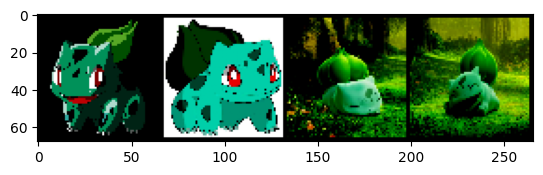

GroundTruth:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur
Predicted:  Squirtle Mewtwo Squirtle Squirtle
Accuracy of the network on the test images: 43 %
Accuracy of the adversarial network on the the test images: 43 %


In [26]:
testloader = torch.utils.data.DataLoader(testset, batch_size = 4, shuffle = False, num_workers=2)
acc = test_on_Pokemon(net, testloader)
print(f'Accuracy of the adversarial network on the the test images: {acc} %')

##Bonus 3: Analyzing Adversarial Attacks (5 points)

Compare the accuracy of your attacked model with your original. What interesting patterns do you notice? What is the benefit of integrating adversarial attacks into our network?

**Findings:**

The adversarially trained network was better able to handle noise. With an epsilon of .05, the adversarily trained model was able to have a correct classification rate of 57%* compared to 9% correct for the original model.

The benefit of integrating adversarial attacks into the network is an increased robustness to noise (both random and targetted)

*(43 shown due to needing to rerun the model due to a mistakenly cleared output. Regarless, a multifold increase over the 9% normal network)



---


# Problem 3: Tensorboard (Optional)

Explore your network using Tensorboard. Tensorboard is a nice tool for visualizing how your network's training is progressing. The following tutorial provides an introduction to Tensorboard

- [Visualizing models, data and training with Tensorboard](https://pytorch.org/tutorials/intermediate/tensorboard_tutorial.html)

For using tensorboard in colab, run the following cell and it should open a tensorboard interface in the output of the cell.


In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>


---

# Problem 4: Save and restore model weights (30 points)

In this section you will learn to save the weights of a trained model, and to load the weights of a saved model. This is really useful when we would like to load an already trained model in order to continue training or to fine-tune it. Often times we save “snapshots” of the trained model as training progresses in case the training is interrupted, or in case we would like to fall back to an earlier model, this is called snapshot saving.


## 4.1 Saving and Loading Weights
In this section you will learn how to [save and load pytorch models for inference](https://pytorch.org/tutorials/beginner/saving_loading_models.html#saving-loading-model-for-inference).

### 4.1.1 State_dict
In PyTorch, the learnable parameters (i.e. weights and biases) of an torch.nn.Module model are contained in the model’s parameters (accessed with model.parameters()). A state_dict is simply a Python dictionary object that maps each layer to its parameter tensor. Because state_dict objects are Python dictionaries, they can be easily saved, updated, altered, and restored, adding a great deal of modularity to PyTorch models and optimizers.

Print out the keys of state_dict of the model you trained in Q2.3.1.

### 4.1.2 Save state_dict

Save the state_dict of the model in Q2.3.1 with the torch.save() function to a local path.

In [27]:
print(MY_PATH + '/trained_model.pt')
torch.save(net.state_dict(), MY_PATH + '/trained_model.pt')
torch.save(net.state_dict(), 'trained_model.pt')
#files.download('checkpoint.pth')

/content/drive/MyDrive/EC523/trained_model.pt


### 4.1.3 Load state_dict

Now let's initiate net2 which has the same structure, and load the weights you saved to net2 by using load_state_dict().

In [28]:
net2 = Net()

## -- ! code required
net2.load_state_dict(torch.load(MY_PATH + '/trained_model.pt'))
net2.eval()

Net(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (relu): ReLU()
  (fc1): Linear(in_features=8192, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=6, bias=True)
)

Let's test net2's performance on Pokemon Dataset

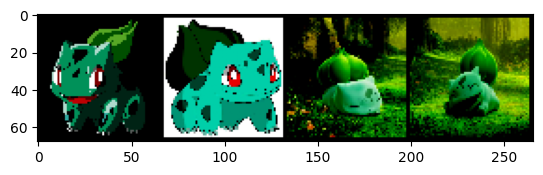

GroundTruth:  Bulbasaur Bulbasaur Bulbasaur Bulbasaur
Predicted:  Squirtle Mewtwo Squirtle Squirtle


In [29]:
## -- ! code required
dataiter = iter(testloader)
images, labels = next(dataiter)

# print images
imshow(torchvision.utils.make_grid(images.cpu()))
print('GroundTruth: ', ' '.join('%5s' % labels_tuple[labels[j]] for j in range(4)))

# make predictions
outputs = net2(images)
_, predicted = torch.max(outputs, 1)

print('Predicted: ', ' '.join('%5s' % labels_tuple[predicted[j]]
                              for j in range(4)))

In [30]:
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data
        images, labels = images.to(device), labels.to(device)
        outputs = net2(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the net2 on the test images: %d %%' % (100 * correct / total))


Accuracy of the net2 on the test images: 43 %


### 4.2 Fine-tune  a pre-trained model on CIFAR-10

[CIFAR-10](https://www.cs.toronto.edu/~kriz/cifar.html) is another popular benchmark for image classification.


![cifar10_teaser](https://miro.medium.com/v2/resize:fit:828/format:webp/1*OSvbuPLy0PSM2nZ62SbtlQ.png)

### 4.2.1 Data Download
Download the CIFAR-10 dataset using `torchvision` and display the RGB images in the first batch.

In [ ]:
import torchvision
from torchvision import transforms, datasets
import torch

# Define the classes to keep
classes_to_keep = [0, 1, 2, 3, 4, 5]

# 0: Airplane
# 1: Automobile
# 2: Bird
# 3: Cat
# 4: Deer
# 5: Dog

# Define the transformation for the dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    transforms.Resize((64, 64))
])

# Define a custom subset class to filter the dataset
class SubsetCIFAR(torchvision.datasets.CIFAR10):
    def __init__(self, root, train=True, transform=None, download=True, classes_to_keep=None):
        super().__init__(root, train=train, transform=transform, download=download)
        if classes_to_keep is not None:
            self.data = [self.data[i] for i in range(len(self.targets)) if self.targets[i] in classes_to_keep]
            self.targets = [self.targets[i] for i in range(len(self.targets)) if self.targets[i] in classes_to_keep]

# Create train and test datasets using the custom subset class
cifar10_trainset = SubsetCIFAR(root='./data', train=True, download=True, transform=transform, classes_to_keep=classes_to_keep)
cifar10_trainloader = torch.utils.data.DataLoader(cifar10_trainset, batch_size=4, shuffle=True, num_workers=2)

cifar10_testset = SubsetCIFAR(root='./data', train=False, download=True, transform=transform, classes_to_keep=classes_to_keep)
cifar10_testloader = torch.utils.data.DataLoader(cifar10_testset, batch_size=4, shuffle=False, num_workers=2)

# Function to display images
def imshow(img):
    img = img / 2 + 0.5  # Unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# Get some random training images
dataiter = iter(cifar10_trainloader)
images, labels = next(dataiter)

# Show images
imshow(torchvision.utils.make_grid(images))
# Print labels
print(' '.join('%5s' % labels[j].numpy() for j in range(4)))


### 4.2.2 Load state_dict partially

Let's define net_cifar = Net(), and only load selected weights in selected_layers.

In [ ]:
# @title Net()
import torch.nn as nn
import torch.nn.functional as F

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 16, kernel_size = 3, padding = 1)

        self.conv2 = nn.Conv2d(in_channels = 16, out_channels = 32, kernel_size = 3, padding = 1)

        self.pool = nn.MaxPool2d(kernel_size = 2, stride = 2)

        self.relu = nn.ReLU()

        self.fc1 = nn.Linear(32 * 16 * 16, 128)                                 # Adjust the input size based on the pooling

        self.fc2 = nn.Linear(128, 64)

        self.fc3 = nn.Linear(64, 6)


    def forward(self, x):

        x = self.conv1(x)

        x = self.relu(x)

        x = self.pool(x)

        x = self.conv2(x)

        x = self.relu(x)

        x = self.pool(x)

        x = x.view(-1, 32 * 16 * 16)

        x = self.fc1(x)

        x = self.fc2(x)

        x = self.fc3(x)

        return x

net = Net()

In [ ]:
net_cifar = Net()
selected_layers = ['conv1.weight', 'conv1.bias', 'conv2.weight', 'conv2.bias', 'fc1.weight', 'fc1.bias', 'fc2.weight', 'fc2.bias']

## -- ! code required
for item in selected_layers:
    net_cifar.state_dict()[item] = net2.state_dict()[item]

### 4.2.3 Fine-tune net_cifar on CIFAR-10

Fine-tune the net_cifar on CIFAR-10 and show the results.

In [ ]:
# @title define criterion, optimizer, device, and train_on_pokemon
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()

optimizer = optim.SGD(net_cifar.parameters(), lr=0.005, momentum=0.9)
net_cifar.to(device)

def train_on_Pokemon(net, optimizer, device, trainloader):
  if torch.cuda.is_available():
      net.cuda()
  net.train()

  for epoch in range(10):                                                       # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader):
        ## -- ! code required
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device) # Send to gpu

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        # print statistics
        #if i % 2000 == 1999:    # print every 2000 mini-batches
        #    print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 2000:.3f}')
        #    running_loss = 0.0

  print('Finished Training')
  return net

In [ ]:
## -- ! code required -- training loop
net_cifar = train_on_Pokemon(net_cifar, optimizer, device, cifar10_trainloader)

#error after training on acc check
#acc = test_on_Pokemon(net_cifar, cifar10_testloader)
#print(f'Accuracy of the lr=0.001 network on the the test images: {acc} %')

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Finished Training


NameError: name 'testloader' is not defined

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

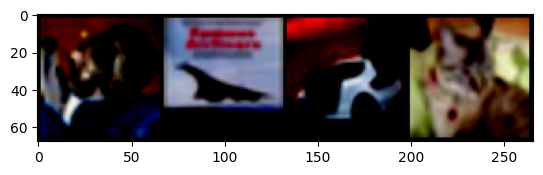

GroundTruth:      3     0     1     3
Predicted:      5     0     5     3


In [ ]:
# code moved here to deal with error without needing to retrain model

# get some random training images
cifar10_dataiter = iter(cifar10_testloader)

## -- ! code required
images, labels = next(cifar10_dataiter)

# print images
imshow(torchvision.utils.make_grid(images.cpu()))
print('GroundTruth: ', ' '.join('%5s' % labels[j].item() for j in range(4)))

# make predictions
outputs = net_cifar(images)
_, predicted = torch.max(outputs, 1)

print('Predicted: ', ' '.join('%5s' % predicted[j].item()
                              for j in range(4)))

In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for data in cifar10_testloader:
        images, labels = data
        images, labels = images.to(device), labels.to(device)
        outputs = net_cifar(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the net_cifar on the test images: %d %%' % (100 * correct / total))

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across th

Accuracy of the net_cifar on the test images: 57 %



---

# Problem 5: Neural style transfer (30 points)

In this problem, we will use deep learning to compose one image in the style of another image. This is known as neural style transfer and the technique is outlined in [A Neural Algorithm of Artistic Style (Gatys et al.)](https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Gatys_Image_Style_Transfer_CVPR_2016_paper.pdf).

Neural style transfer is an optimization technique used to take two images—a content image and a style reference image (such as an artwork by a famous painter)—and blend them together so the output image looks like the content image, but “painted” in the style of the style reference image.

This is implemented by optimizing the output image to match the content statistics of the content image and the style statistics of the style reference image. These statistics are extracted from the images using a convolutional network.

![inputs](https://www.tensorflow.org/tutorials/generative/style_transfer_files/output__UWQmeEaiKkP_0.png)
![output](https://www.tensorflow.org/tutorials/generative/style_transfer_files/output_iYSLexgRKSh-_0.png)

In [31]:
from __future__ import print_function

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

## 5.0 Visualize the inputs

We provide two images, starry.jpg and golden.jpg, for style and content input respectively. To save runtime, we downscale the images to (128,128). You are welcome to play with your own inputs at any resolution scale (note a larger resolution requires more runtime).

In [32]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# desired size of the output image
imsize = (128,128)

loader = transforms.Compose([
    transforms.Resize(imsize),                                                  # scale imported image
    transforms.ToTensor()])                                                     # transform it into a torch tensor


def image_loader(image_name):
    image = Image.open(image_name)
    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)


style_img = image_loader("/content/drive/MyDrive/EC523 HW3-2024/starry.jpg")
content_img = image_loader("/content/drive/MyDrive/EC523 HW3-2024/golden.jpg")

assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"

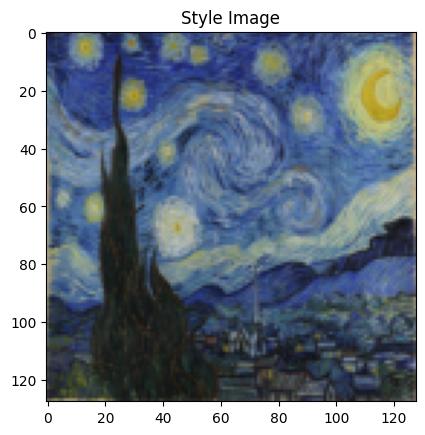

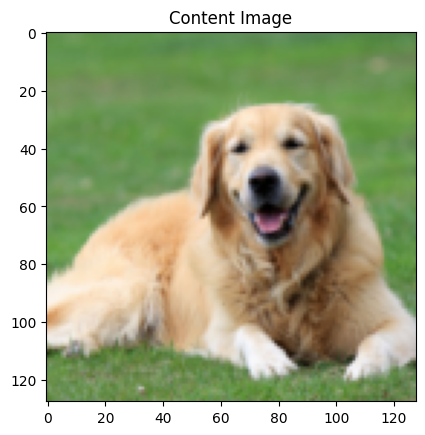

In [33]:
unloader = transforms.ToPILImage()                                              # reconvert into PIL image

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()                                                # we clone the tensor to not do changes on it
    image = image.squeeze(0)                                                    # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)                                                            # pause a bit so that plots are updated

plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

## 5.1 Loss functions



### 5.1.1 Content Loss

The content of an image is represented by the values of the intermediate feature maps. Finish the ContentLoss() to match the corresponding content target representations.

In [34]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        ## -- ! code required
        self.loss = F.mse_loss(input, self.target)
        return input

### 5.1.2 Style Loss

The style of an image can be described by the means and correlations across the different feature maps. Calculate a Gram matrix that includes this information and finish the StyleLoss().

In [35]:
def gram_matrix(input):
    a, b, c, d = input.size()
    features = input.view(a * b, c * d)
    G = torch.mm(features, features.t())
    return G.div(a * b * c * d)

class StyleLoss(nn.Module):

    def __init__(self, target):
        super(StyleLoss, self).__init__()
        #self.target = self.target = target.detach() #orig
        self.target = gram_matrix(target).detach()

    def forward(self, input):
        ## -- ! code required
        gram = gram_matrix(input)
        self.loss = F.mse_loss(gram, self.target)
        return input

### 5.1.3 Import a pre-trained VGG-19.

Now we need to import a pre-trained neural network. We will use a 19 layer VGG network like the one used in the paper.

Import a pretrained VGG-19 from [torchvision.models](https://pytorch.org/docs/stable/torchvision/models.html). Make sure to set the network to evaluation mode using .eval().

In [36]:
## -- ! code required
cnn = models.vgg19(weights=models.VGG19_Weights.DEFAULT).features.eval()

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:11<00:00, 51.2MB/s]


### 5.1.4 VGG-19 pre-processing

VGG networks are trained on images with each channel normalized by mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225].

Complete Normalization() to normalize the image before sending it into the network.

In [37]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

# create a module to normalize input image so we can easily put it in a nn.Sequential
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = mean.clone().detach()
        self.std = std.clone().detach()

    def forward(self, img):
        # normalize img
        ## -- ! code required
        # print(img.shape)

        #out = (img - self.mean.view(-1, 1, 1)) / self.std.view(-1, 1, 1)
        out = (img - self.mean.view(-1, 1, 1)) / self.std.view(-1, 1, 1)

        # print(img.shape)
        return out

### 5.1.5 Get content/style representations

Choose intermediate layers from the network to represent the style and content of the image. Use the selected intermediate layers of the model to get the content and style representations of the image. In this problem, you are using the VGG19 network architecture, a pretrained image classification network. These intermediate layers are necessary to define the representation of content and style from the images.

Complete the get_style_model_and_losses() so you can easily extract the intermediate layer values.

In [38]:
def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img, content_layers, style_layers):
    cnn = copy.deepcopy(cnn)

    # normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # just in order to have an iterable access to or list of content/syle losses
    content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            ## -- ! code required

            # print("if content_layers")
            # print(content_img)
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)
            # print("post content_layers")


        if name in style_layers:
            # add style loss:
            ## -- ! code required
            # print("if style_layers")
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)
            # print("post style_layers")


    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break
    model = model[:(i + 1)]
    return model, style_losses, content_losses

## 5.2 Build the model

### 5.2.1 Perform the neural transfer

Finally, we must define a function that performs the neural transfer. For each iteration of the networks, it is fed an updated input and computes new losses. We will run the backward methods of each loss module to dynamicaly compute their gradients. The paper recommends LBFGS, but Adam works okay, too.

Complete the run_style_transfer().

In [39]:
content_layers_selected = ['conv_4']
style_layers_selected = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1,
                       content_layers=content_layers_selected,
                       style_layers=style_layers_selected):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img, content_layers, style_layers)

    optimizer = optim.Adam([input_img.requires_grad_()], lr=0.1, eps=1e-1)


    print('Optimizing..')
    step_i = 0
    while step_i <= num_steps:
        input_img.data.clamp_(0, 1)

        ## -- ! code required

        optimizer.zero_grad()
        model(input_img)
        style_score = 0
        content_score = 0

        for sloss in style_losses:
            style_score += sloss.loss
        for closs in content_losses:
            content_score += closs.loss

        loss = style_score * style_weight + content_score * content_weight
        loss.backward()

        optimizer.step()


        step_i += 1
        if step_i % 50 == 0:
            print("run {}:".format(step_i))
            print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                style_score.item(), content_score.item()))
            print()

    # a last correction...
    input_img.data.clamp_(0, 1)

    return input_img

### 5.2.2 Test your model

Now you have completed your codes, let's test them!

Building the style transfer model..
Optimizing..
run 50:
Style Loss : 0.000910 Content Loss: 31.027393

run 100:
Style Loss : 0.000142 Content Loss: 30.303606



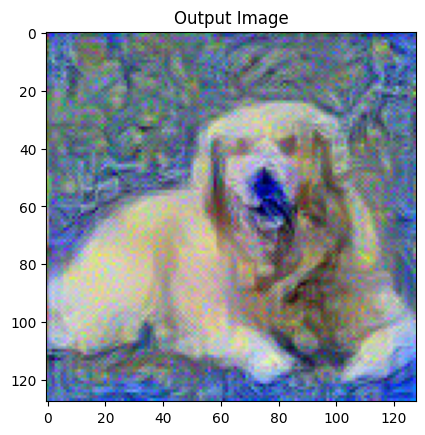

In [ ]:
content_layers_selected = ['conv_4']
style_layers_selected = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']
style_weight=1000000
input_img = content_img.clone().detach().requires_grad_(True)

output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=100,style_weight=style_weight,
                            content_layers=content_layers_selected,
                            style_layers=style_layers_selected)

plt.figure()
imshow(output, title='Output Image')

plt.ioff()
plt.show()

## 5.3 Content/style loss weight ratio

Try two different style loss weights: 5000 and  10. Discuss what you learn from the results.

Building the style transfer model..
Optimizing..
run 50:
Style Loss : 0.001036 Content Loss: 5.006029

run 100:
Style Loss : 0.000598 Content Loss: 4.731911



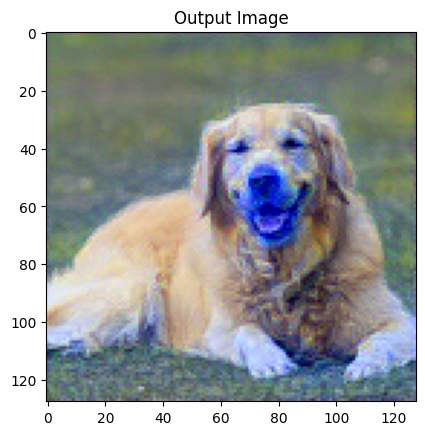

In [ ]:
## -- ! code required -- style loss weight 5000
content_layers_selected = ['conv_4']
style_layers_selected = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']
style_weight=5000
input_img = content_img.clone().detach().requires_grad_(True)

output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=100,style_weight=style_weight,
                            content_layers=content_layers_selected,
                            style_layers=style_layers_selected)

plt.figure()
imshow(output, title='Output Image')

plt.ioff()
plt.show()

Building the style transfer model..
Optimizing..
run 50:
Style Loss : 0.008453 Content Loss: 0.000651

run 100:
Style Loss : 0.008439 Content Loss: 0.000701



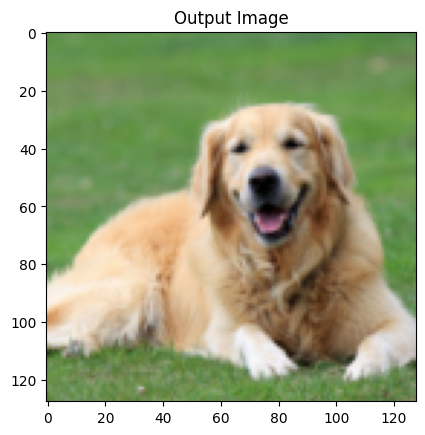

In [ ]:
## -- ! code required -- style loss weight 10
content_layers_selected = ['conv_4']
style_layers_selected = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']
style_weight=10
input_img = content_img.clone().detach().requires_grad_(True)

output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=100,style_weight=style_weight,
                            content_layers=content_layers_selected,
                            style_layers=style_layers_selected)

plt.figure()
imshow(output, title='Output Image')

plt.ioff()
plt.show()

**Discussion:**

The higher the style weight, the more emphasis is placed on transfering the style to the content image. A style weight of just 10 leads to minimal changes (with the lowest content loss). There might be a tinge of blue in some of the fur, but a large style weight of 5000 will emphasize the features of the style content and transfer them into the content image. This will lead to a higher content loss, but the end result is the intended outcome, a content image with the stylistic characteristics of the style image.

## 5.3 Choose different intermediate layers

Try three different intermediate layers for style representations: conv_1, conv_3 and conv_5. Discuss what you learn from the results.

Building the style transfer model..
Optimizing..
run 50:
Style Loss : 0.000914 Content Loss: 0.831137

run 100:
Style Loss : 0.000143 Content Loss: 0.933622



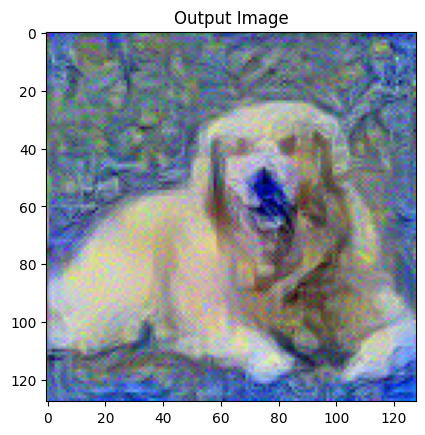

In [ ]:
# @title style = conv_1
## -- ! code required --style = conv_1
content_layers_selected = ['conv_1']
style_layers_selected = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']
style_weight=1000000
input_img = content_img.clone().detach().requires_grad_(True)

output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=100,style_weight=style_weight,
                            content_layers=content_layers_selected,
                            style_layers=style_layers_selected)

plt.figure()
imshow(output, title='Output Image')

plt.ioff()
plt.show()

Building the style transfer model..
Optimizing..
run 50:
Style Loss : 0.000912 Content Loss: 16.058781

run 100:
Style Loss : 0.000142 Content Loss: 15.825830



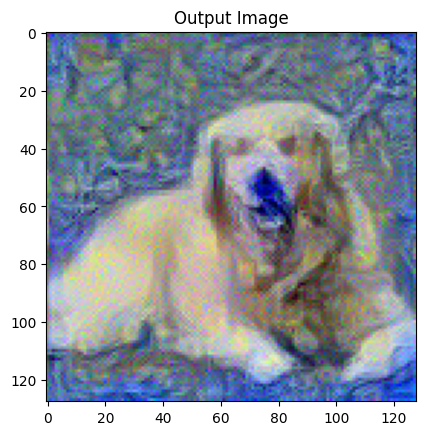

In [ ]:
# @title style = conv_3
## -- ! code required --style = conv_3
content_layers_selected = ['conv_3']
style_layers_selected = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']
style_weight=1000000
input_img = content_img.clone().detach().requires_grad_(True)

output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=100,style_weight=style_weight,
                            content_layers=content_layers_selected,
                            style_layers=style_layers_selected)

plt.figure()
imshow(output, title='Output Image')

plt.ioff()
plt.show()

Building the style transfer model..
Optimizing..
run 50:
Style Loss : 0.000913 Content Loss: 54.282951

run 100:
Style Loss : 0.000143 Content Loss: 53.529545



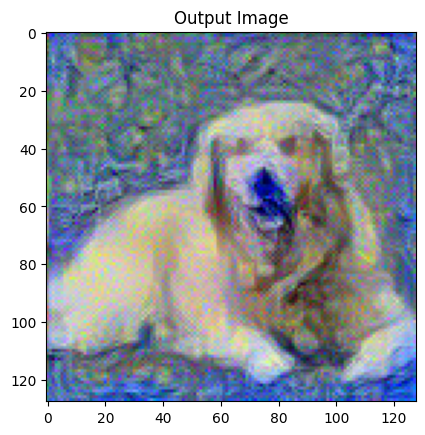

In [ ]:
# @title style = conv_5
## -- ! code required --style = conv_5
content_layers_selected = ['conv_5']
style_layers_selected = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']
style_weight=1000000
input_img = content_img.clone().detach().requires_grad_(True)

output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=100,style_weight=style_weight,
                            content_layers=content_layers_selected,
                            style_layers=style_layers_selected)

plt.figure()
imshow(output, title='Output Image')

plt.ioff()
plt.show()

**Discussion:**

The later in the neural network the content layer is, the more content loss is seen in the image. This makes sense since the neural network is training on the style image for more layers before the content layer is introduced.

I would expect more content loss to show a more stylistic picture (less like the original content image), but the images generated by the conv_1 content layer and the conv_5 content layer selections look too similar for me to tell apart.